# Intent Clustering, Document Embeddings, and Unsupervised Learning

In this notebook, I take the preprocessed and tokenized data in the previous notebook and try to assign labels for each Tweet in the dataset by using meaningful document embedding methods (so my models can read the data) and unsupervised learning methods such as K-Means, DBScan, and LDA.

I've grouped my intents into classes, which total up to ~11. For succicient NN training for intent classification on unseen data, I think 1000 per intent is useful.

In [25]:
# We need more packages!
# Data science
import pandas as pd
print(f"Pandas: {pd.__version__}")
import numpy as np
print(f"Numpy: {np.__version__}")

# Unsupervised Learning
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from zeugma.embeddings import EmbeddingTransformer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.datasets import make_multilabel_classification
from sklearn.metrics import silhouette_score, silhouette_samples

# Visualization 
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="ticks", color_codes=True)
from sklearn.manifold import TSNE

# Word Embeddings
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import TweetTokenizer
import gensim
print(f'gensim: {gensim.__version__}')

# Doc2Vec
from nltk.tokenize import word_tokenize 
from gensim.test.utils import common_texts
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.test.utils import get_tmpfile

# Storing as objects via serialization
from tempfile import mkdtemp
import pickle
import joblib

# Directory
import os
import yaml

# Cool progress bars
from tqdm import tqdm_notebook as tqdm
tqdm().pandas()  # Enable tracking of execution progress

# Reading in intents
with open(r'objects/intents.yml') as file:
    intents = yaml.load(file, Loader=yaml.FullLoader)
    
# Loading in the already saved processed dataset
processed_inbound = pd.read_pickle('objects/processed_inbound.pkl')

# Representing my tokenized data as String documents and storing it into a variable
string_processed_inbound = processed_inbound.progress_apply(" ".join)

# We start with this data, here's the preview
processed_inbound.head()

Pandas: 1.0.5
Numpy: 1.18.5
gensim: 3.8.0


/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/tqdm/std.py:668: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


0     [new, update, i️, make, sure, download, yester...
4     [hey, anyone, else, upgraded, io, issue, capit...
9     [hello, internet, someone, explain, symbol, ke...
10    [get, screenshot, say, iphonex, reserve, email...
12    [thank, update, phone, even, slow, barely, wor...
dtype: object

# Embedding and Vectorizing in a Meaningful Way

It is incredibly important to be able to represent this text data as in a meaningful way as to have similar Tweets have closer distances than different Tweets that have different intents. However, since I am working with sequences, I could not just embed their individual words because that will result in a different dimensionality for every single Tweet, and this is something that unsupervised learning algorithms do not know how to handle.

Some of these document embedding methods are:
* BERT
* FastText
* Doc2Vec
* Word2Vec (NN architecture)
* Skipthought
* gloVe (word embedding)

With these, you'll get some kind of file with those words and you'll basically generate this word-to-word embedding matrix and you pass it in as the weights layer in your Neural Network.

Note that with these pretrained embeddings, someone has run this on a massive data and released the embeddings the model learned on the internet, which I am grateful for. GPT-3 was just trained by OpenAI (an AI company based in San Francisco), has 175 billion paramaters!

Also, there are different contexts with learning. It might have been trained with the words from like academic papers, and the meaning of the word it learns is might be different than general twitter data, which is why I explore many methods and try to find what they are trained on.

### 1. Count Vectorization

The easiest way to represent a document as a vector is with a bagofwords CountVectorizer. This will turn each document to be a 1D array, which I think is a good starting point for putting into my clustering algorithms. Let's see how it does. 

The count vectorizer only accepts the Series if the document is represented as a String, not a tokenized list. This string form also represents each row as a document. That's ultimately what I need to do for my clustering to be effective, because each point needs to represent one sequence altogether, not vectorized individual words.

I set the min_df paramater to 5 to only include terms that occur more than 5 times in my Count Vectorized data.

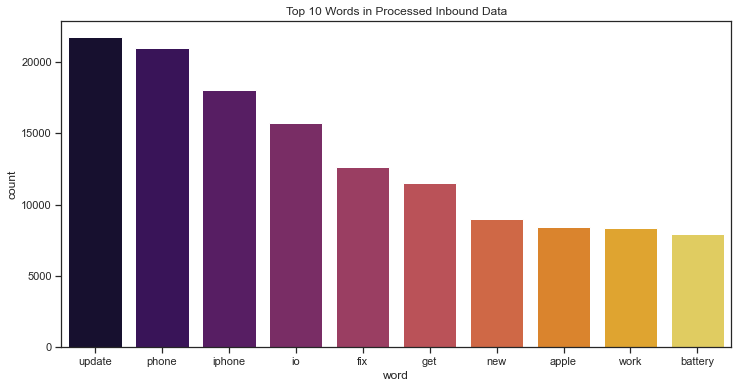

In [6]:
# Vectorizing the data with Count Vectorizer
bagofwords = CountVectorizer(min_df = 5).fit(string_processed_inbound)
inbound_cv = bagofwords.transform(string_processed_inbound)

# For visualizing top 10
def top10_bagofwords(data, output_name, title):
    ''' Taking as input the data and plots the top 10 words based on counts in this text data'''
    bagofwords = CountVectorizer()
    # Output will be a sparse matrix
    inbound = bagofwords.fit_transform(data)
    # Inspecting of often contractions and colloquial language is used
    word_counts = np.array(np.sum(inbound, axis=0)).reshape((-1,))
    words = np.array(bagofwords.get_feature_names())
    words_df = pd.DataFrame({"word":words, 
                             "count":word_counts})
    words_rank = words_df.sort_values(by="count", ascending=False)
    # words_rank.to_csv('words_rank.csv') # Storing it in a csv so I can inspect and go through it myself
    words_rank.head()
    # Visualizing top 10 words
    plt.figure(figsize=(12,6))
    sns.barplot(words_rank['word'][:10], words_rank['count'][:10].astype(str), palette = 'inferno')
    plt.title(title)
    
    # Saving
    plt.savefig(f'visualizations/{output_name}.png')
    
    plt.show()


top10_bagofwords(string_processed_inbound, 'initial_frequencies', 'Top 10 Words in Processed Inbound Data')

I mostly use count vectorizer to see top 10 words that occur in a particular dataset and visualize it here.

From the visualization above, this tells me most of the customer queries are about phones, particularly iOS and battery fixes. We also see thanks rank quite high, which is a good thing because it might indicate gratitude (which indicates a closing intent for my chatbot). Hi (rank 44) and hey (rank 25) classifies a greeting intent, and it's good to see that they appear a lot of times. Things are looking promising right now, but we wouldn't be able to see the quality until we actually start clustering.

### 2.TFIDF

In [3]:
tfidf = TfidfVectorizer(min_df=5, ngram_range = (1,3))
# Storing tfidf data and transforming them into sparse matrices
inbound_tfidf = tfidf.fit_transform(string_processed_inbound)
inbound_tfidf

<75958x33814 sparse matrix of type '<class 'numpy.float64'>'
	with 1248350 stored elements in Compressed Sparse Row format>

## Pretrained word embeddings

Bag of words lose many of the subtleties such as word ordering. This is why I will try these other text vectorization methods. These days we have more effective methods, especially since what I want to encode in these vectors are intent clusters.

### 3. GloVe
I am going to use multiple word embeddings to vectorize my text in different ways, and then test which one is the best word embedding to use, starting with the Glove word embedding. GloVe is an unsupervised learning algorithm for getting vector representations for words.

Gensim constrains pretrained word embeddings and have a special data format where you can basically load it in as a numpy array.

DISCLAIMER: I won't be using this one because my clustering algorithms only work when each tweet is one point, and this is a word transformer. I am leaving this part in my notebook as a progress log.

Useful sources for this step: 
* [Guide to word to vec word embeddings](https://towardsdatascience.com/a-beginners-guide-to-word-embedding-with-gensim-word2vec-model-5970fa56cc92)
* Zeugma Docs
    * https://pypi.org/project/zeugma/0.41/
    * https://github.com/nkthiebaut/zeugma

In [7]:
glove = EmbeddingTransformer('glove')
# Applying it to the entire training data
inbound_glove = string_processed_inbound.progress_apply(glove.transform)
# Preview shapes
inbound_glove.iloc[0].shape, inbound_glove.iloc[1].shape

As we can see, gloVe transforms individual sentences as multiple word vectors. We need an algorithm that transforms the entire sentence to one vector, so that it represents one point in space.

It's interesting, though, to play with this around conceptually even if we won't use it. We can check the cosine similarity between the first and second sentence should give you similarities across words in the sequence, which is interesting because it works when they are of different length.

In [8]:
similarity = cosine_similarity(inbound_glove.iloc[0], inbound_glove.iloc[1])
similarity

array([[0.756021  , 0.64597446, 0.40145397, ..., 0.6983064 , 0.7663161 ,
        0.7225855 ],
       [0.71256834, 1.0000001 , 0.44998685, ..., 0.8832329 , 0.6832133 ,
        0.635868  ],
       [0.7464738 , 0.5603475 , 0.34391314, ..., 0.7372012 , 0.8659827 ,
        0.73939735],
       ...,
       [0.84564346, 0.7264565 , 0.73543733, ..., 0.8847177 , 0.829172  ,
        0.83396137],
       [0.7249006 , 0.717424  , 0.74351704, ..., 0.76875883, 0.73598516,
        0.73740643],
       [0.52425843, 0.44998685, 0.9999997 , ..., 0.5408973 , 0.48958838,
        0.5868363 ]], dtype=float32)

As for intepretation, the cosine similarity could be 0 if the two vectors are perpendicular. And it seems that the similarity matrix takes the shape of the longer matrix that it compares.

## 4. Doc2Vec
Since this is the main embedding method I will use for my pipeline, I display how I capitalized this embedding in the next notebook.

## 5. Hugging Face
This is a startup that does a lot with NLP. I explore their encoders.

BERT wouldn't really be a good option because a large part of that was trained with Wikipedia data.

I am not sure what doc2vec is trained on, I think my results will be better if I find a Twitter based word embedding!

## 6. Fast-text 


# Scaling the Data

Before we cluster, let's make scaled versions of our dataset first, which would be good for distance-based clustering methods. In general, these vectors shouldn't really need scaling, but it may help for computational purposes. I only do this for my count vectorized and tfidf vectorized data, not ones with the more meaningful word embeddings.

In [97]:
# This is the data we have so far, they are stored in CSR compressed format
inbound_cv, inbound_tfidf

(<79760x5178 sparse matrix of type '<class 'numpy.int64'>'
 	with 810431 stored elements in Compressed Sparse Row format>,
 <79760x35654 sparse matrix of type '<class 'numpy.float64'>'
 	with 1342360 stored elements in Compressed Sparse Row format>)

In [98]:
# Fitting and transforming to create standard scaled versions of my data
inbound_cv_ma = MaxAbsScaler().fit_transform(inbound_cv)
inbound_tfidf_ma = MaxAbsScaler().fit_transform(inbound_cv)

inbound_cv_ma, inbound_tfidf_ma

# Tweet Collection With Clustering

**Training Consideration:** Because I will train a neural network in the next part of my project, my goal is to have around 10 intents (depending on the actual number of natural intents in the data, by doing EDA). For each of these 10 intents, I would like to have around 1000 examples for each. I picked this specific number because I want an even distribution of examples per intent, so that I don't have class imbalance and my neural network can classify those ten classes relatively well.

With this in mind, let the exploring begin!

I will try to use clustering methods and topic modelling on my data to pull out major themes and manually label these clusters.

I will have more success if my data is all around the same type of domain of customer service, and I was careful to make sure this Twitter Apple data is. That way, my model in the next notebook will capture the nuances of intent classification. Generally, the bot is going to be good at conversing topics on the language it's trained on.

I am aware that with clustering, you can't expect your model to cluster the data the way you want it to be clustered beforehand. It's an algorithm overall. I would wish that they will magically cluster intents together easily, however it might now be that easy! We shall see.

## <font color='blue'>1. K Means</color>
My first approach for the clustering my word vectors is K-Means, which tends to perform well on blobs.

A drawback is that it is very slow, and picking the value for K is hard - I don't even know how many intents there are in the data. This is why I start with larger jumps of K to get a higher level idea of which performs the best, then I dive deeper to finally decide what K works the best for finding the optimal number of intents in my dataset.

## 1.1. K-Means for my TFIDF and Count Vectorized Data
First I cluster the TFIDF and Count Vectorized data. Honestly, I won't really be expecting good results from it, so I won't spend a lot of effort doing this actual clustering on these two. But it's worth a shot to demonstrate an older and suboptimal approach.

In [100]:
# Vectorized data
vectorized_data = {'inbound_cv_ma': inbound_cv_ma, 'inbound_tfidf_ma': inbound_tfidf_ma}
# Briefly showing the contents of i and j
for i,j in enumerate(vectorized_data.items()): print(i,j);

0 ('inbound_cv_ma', <79760x5178 sparse matrix of type '<class 'numpy.float64'>'
	with 810431 stored elements in Compressed Sparse Row format>)
1 ('inbound_tfidf_ma', <79760x5178 sparse matrix of type '<class 'numpy.float64'>'
	with 810431 stored elements in Compressed Sparse Row format>)


I am running my entire K-Means on all my data here. And I am doing hyperparamater optimization on n_clusters. The first progress bar is how it's doing with the dataset, the second one is it's completion of all the n_clusters.

It took me three hours to apply K-Means over 10 iterations from 10 to 100 for both data types, before scaling. Fortunately, after I scaled it trained much faster. 

I store my results using Python's serialization package called Pickle below this cell so I don't have to run it again!

In [106]:
%%time
# My grand dictionaries that will store all my results
wcss_grand = {}
labels_grand = {}
silhouette_scores_grand = {}
n_clusters = [10,20,30,40,50,60,70,80,90,100]

# Iterating through all the differently embedded data
for i,j in tqdm(enumerate(vectorized_data.items())): 
    name = j[0] # Here j[0] is the name of the dataset
    dataset = j[1] # And j[1] is the actual data
    
    # I store my metrics at these following lists
    wcss = []
    labels = []
    silhouette_scores = []
    
    # Looping through values of k
    for k in tqdm(n_clusters):    
        print(f'Currently fitting {name} with {k} clusters... Please wait')
        
        # Initializing with k-means++ ensures that you get don’t fall into the random initialization trap.
        kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state = 10)
        kmeans.fit(dataset)
        wcss.append(kmeans.inertia_)
        
        # Getting the silhouette score
        labels.append(kmeans.labels_)
        silhouette_scores.append(silhouette_score(dataset, kmeans.labels_))
        
        # Saving the models
        filename = f'models/kmeans/{name}-{k}neighbors.sav'
        joblib.dump(kmeans, filename)
        
    # Updating grand dictionary
    wcss_grand[name + '_wcss'] = wcss
    labels_grand[name + '_labels'] = labels
    silhouette_scores_grand[name + '_silhouettes'] = silhouette_scores

# Saving all my results
with open('objects/wcss_grand.pkl', 'wb') as handle:
    pickle.dump(wcss_grand, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('objects/labels_grand.pkl', 'wb') as handle:
    pickle.dump(labels_grand, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
with open('objects/silhouette_scores_grand.pkl', 'wb') as handle:
    pickle.dump(silhouette_scores_grand, handle, protocol=pickle.HIGHEST_PROTOCOL)

/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Currently fitting inbound_cv_ma with 10 clusters... Please wait
Currently fitting inbound_cv_ma with 20 clusters... Please wait
Currently fitting inbound_cv_ma with 30 clusters... Please wait
Currently fitting inbound_cv_ma with 40 clusters... Please wait
Currently fitting inbound_cv_ma with 50 clusters... Please wait
Currently fitting inbound_cv_ma with 60 clusters... Please wait
Currently fitting inbound_cv_ma with 70 clusters... Please wait
Currently fitting inbound_cv_ma with 80 clusters... Please wait
Currently fitting inbound_cv_ma with 90 clusters... Please wait
Currently fitting inbound_cv_ma with 100 clusters... Please wait



/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Currently fitting inbound_tfidf_ma with 10 clusters... Please wait
Currently fitting inbound_tfidf_ma with 20 clusters... Please wait
Currently fitting inbound_tfidf_ma with 30 clusters... Please wait
Currently fitting inbound_tfidf_ma with 40 clusters... Please wait
Currently fitting inbound_tfidf_ma with 50 clusters... Please wait
Currently fitting inbound_tfidf_ma with 60 clusters... Please wait
Currently fitting inbound_tfidf_ma with 70 clusters... Please wait
Currently fitting inbound_tfidf_ma with 80 clusters... Please wait
Currently fitting inbound_tfidf_ma with 90 clusters... Please wait
Currently fitting inbound_tfidf_ma with 100 clusters... Please wait


CPU times: user 1h 20min 30s, sys: 13min 32s, total: 1h 34min 2s
Wall time: 1h 31min 21s


### Reading back in the results

In [111]:
# Storing it into objects I can use in this notebook

with open('objects/wcss_grand.pkl', 'rb') as handle:
    wcss_grand = pickle.load(handle)
with open('objects/labels_grand.pkl','rb') as handle:
    labels_grand = pickle.load(handle)
with open('objects/silhouette_scores_grand.pkl','rb') as handle:
    silhouette_scores_grand = pickle.load(handle)

## Finding the Best K-Means Model

I am making an elbow plot to see if there is a clear elbow, which hopefully I'll find one but it's not very likely.

I first do it for **count vectorized** data then I did it for the **tfidf** vectorized data:

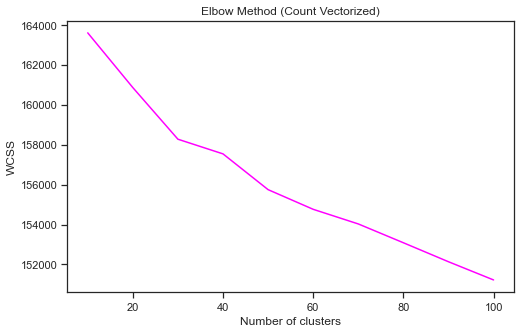

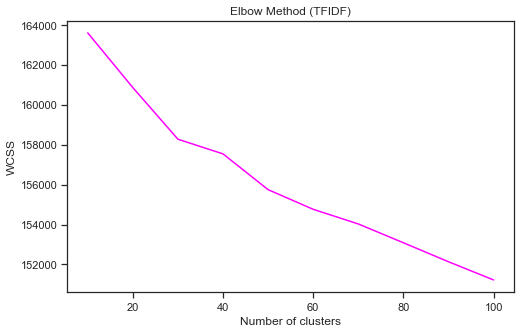

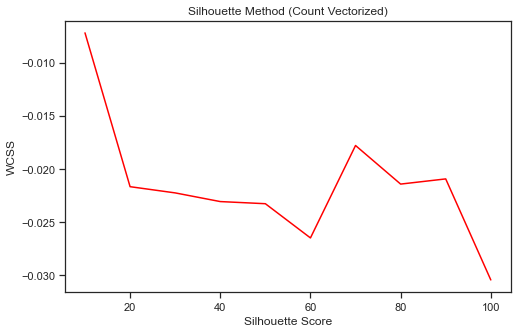

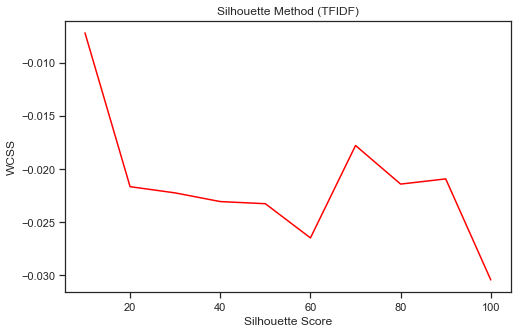

In [126]:
# Elbow Plot count vectorized
plt.figure(figsize=(8,5))
plt.plot(range(10, 101, 10), wcss_grand['inbound_cv_ma_wcss'], color = 'magenta')
plt.title('Elbow Method (Count Vectorized)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Elbow Plot tfidf
plt.figure(figsize=(8,5))
plt.plot(range(10, 101, 10), wcss_grand['inbound_tfidf_ma_wcss'], color = 'magenta')
plt.title('Elbow Method (TFIDF)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Silouette Plot count vectorized
plt.figure(figsize=(8,5))
plt.plot(range(10, 101, 10), silhouette_scores_grand['inbound_cv_ma_silhouettes'], color = 'red')
plt.title('Silhouette Method (Count Vectorized)')
plt.xlabel('Silhouette Score')
plt.ylabel('WCSS')
plt.show()

# Silouette Plot tfidf
plt.figure(figsize=(8,5))
plt.plot(range(10, 101, 10), silhouette_scores_grand['inbound_tfidf_ma_silhouettes'], color = 'red')
plt.title('Silhouette Method (TFIDF)')
plt.xlabel('Silhouette Score')
plt.ylabel('WCSS')
plt.show()

We see that these plots don't really change much between the TFIDF and Count Vectorized data, furthering my statement above that they aren't really going to be the most useful.

## Visualizing my Clusters with t-SNE

I try different color maps and choose one so it's easier to distinguish between clusters.

Available sequential colormaps:
```['viridis', 'plasma', 'inferno', 'magma', 'cividis']```

```['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
            'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']```

Available qualitative colormaps:
```['Pastel1', 'Pastel2', 'Paired', 'Accent',
                        'Dark2', 'Set1', 'Set2', 'Set3',
                        'tab10', 'tab20', 'tab20b', 'tab20c']```

In [129]:
# Current data
inbound_cv_ma.shape, inbound_tfidf_ma.shape

((79760, 5178), (79760, 5178))

t-SNE is a probabilitic model, so this will take some time to do, especially because we have ~80k rows.

In [ ]:
%time
# Instantiate t-SNE
tsne = TSNE(n_components=2, random_state=1, n_jobs=-1)

# Fit t-SNE
inbound_cv_ma_tsne = tsne.fit_transform(inbound_cv_ma)

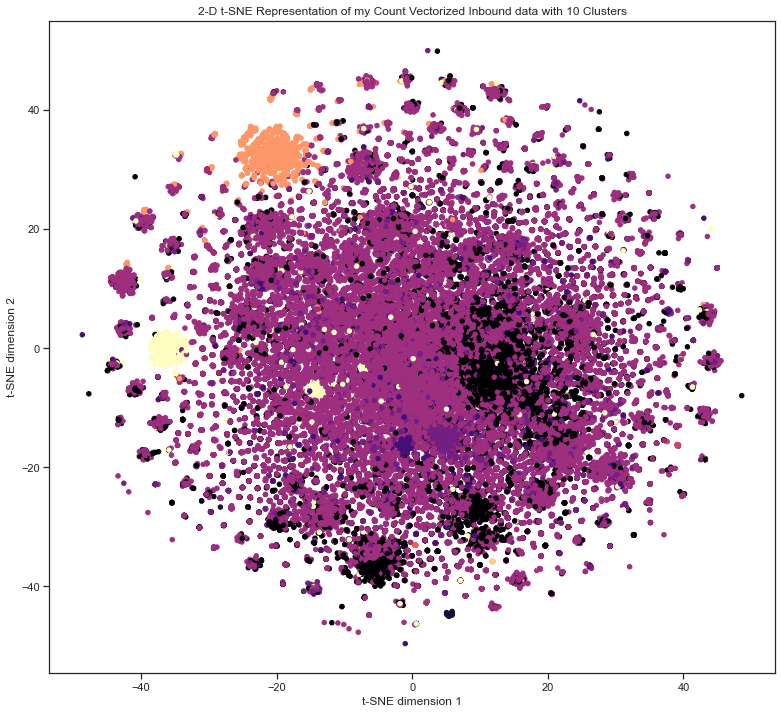

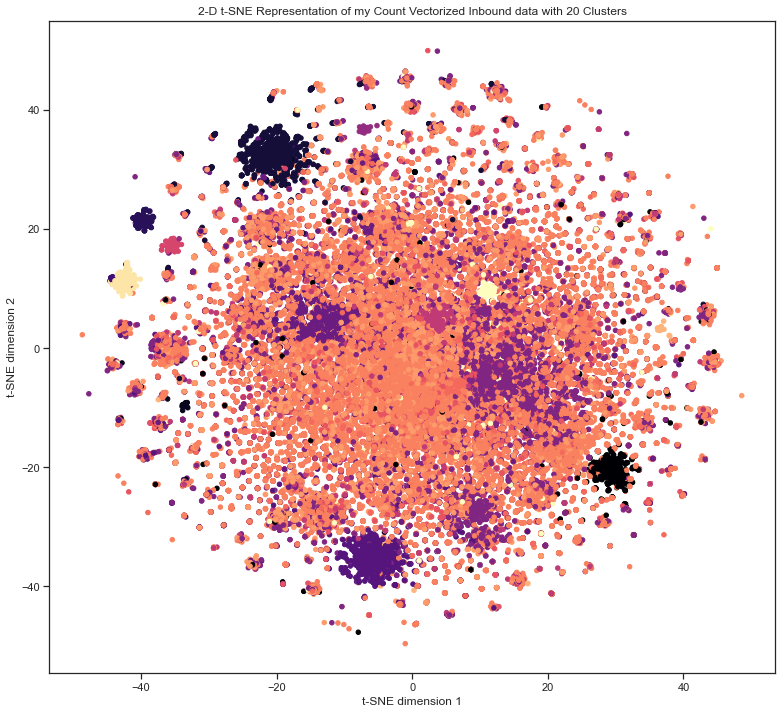

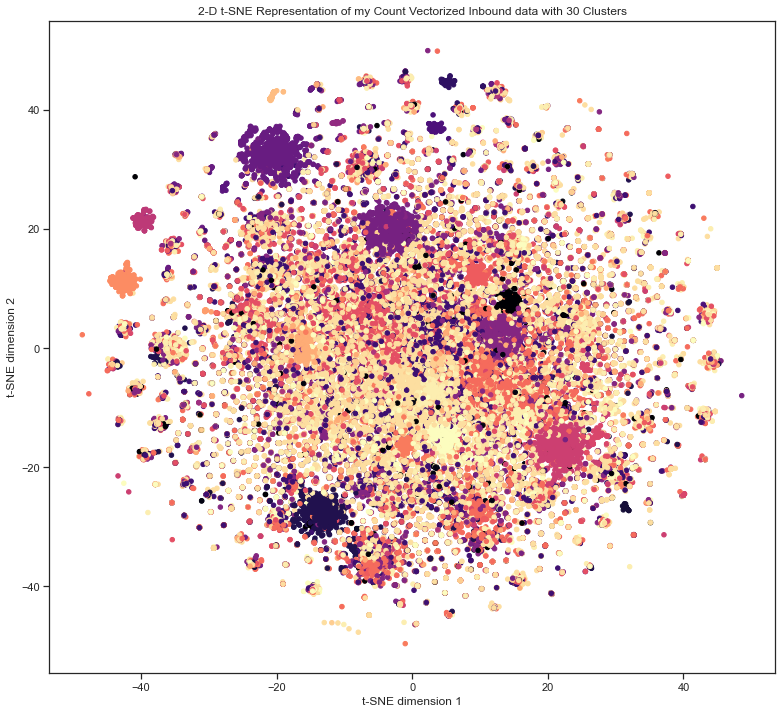

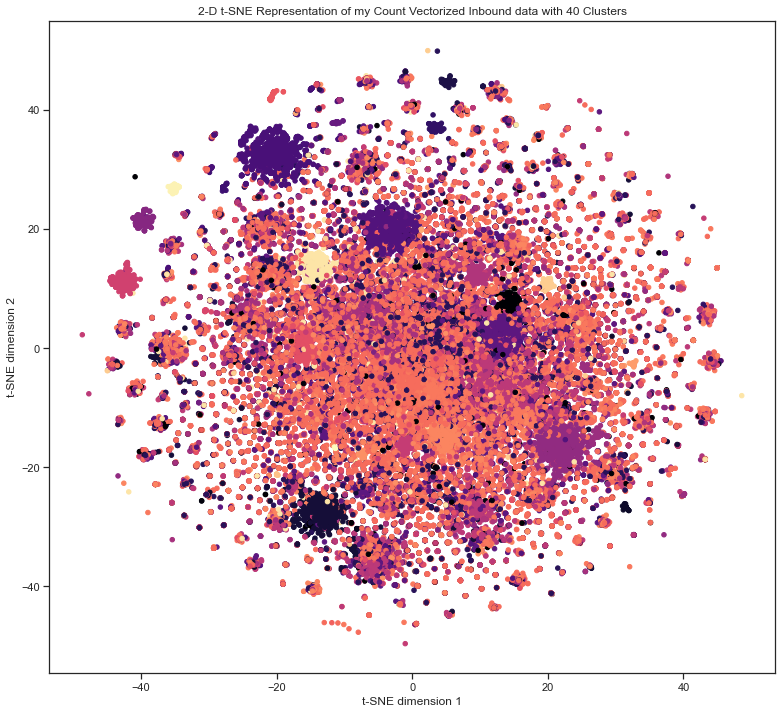

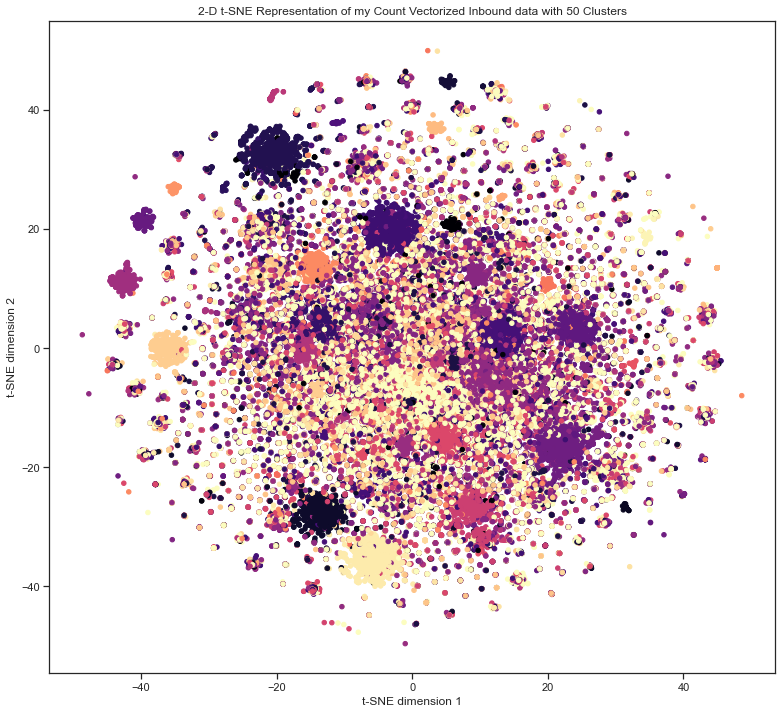

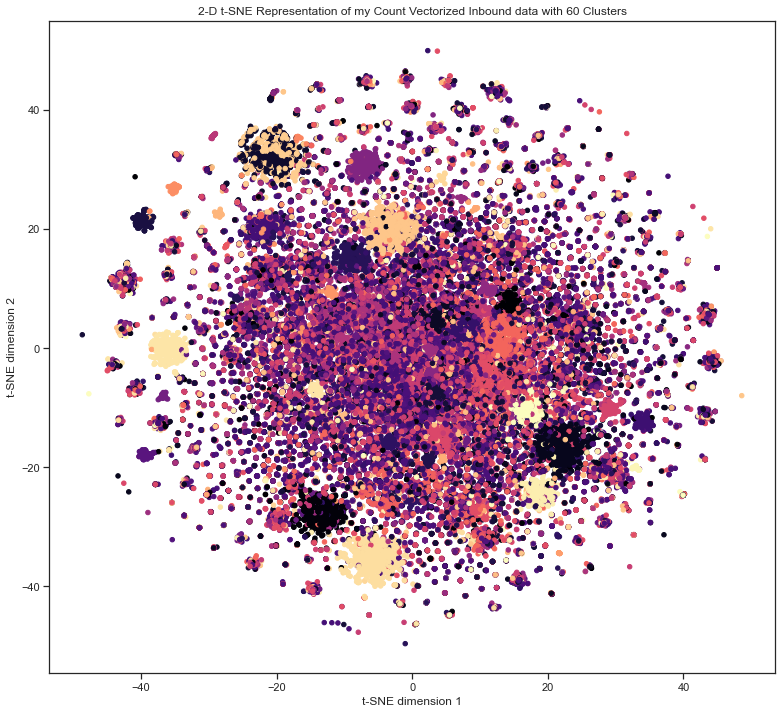

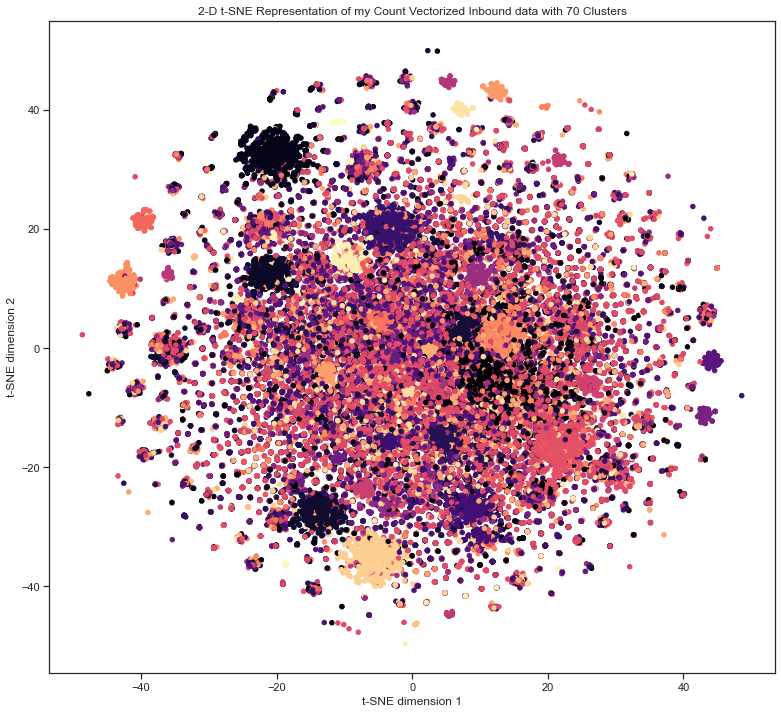

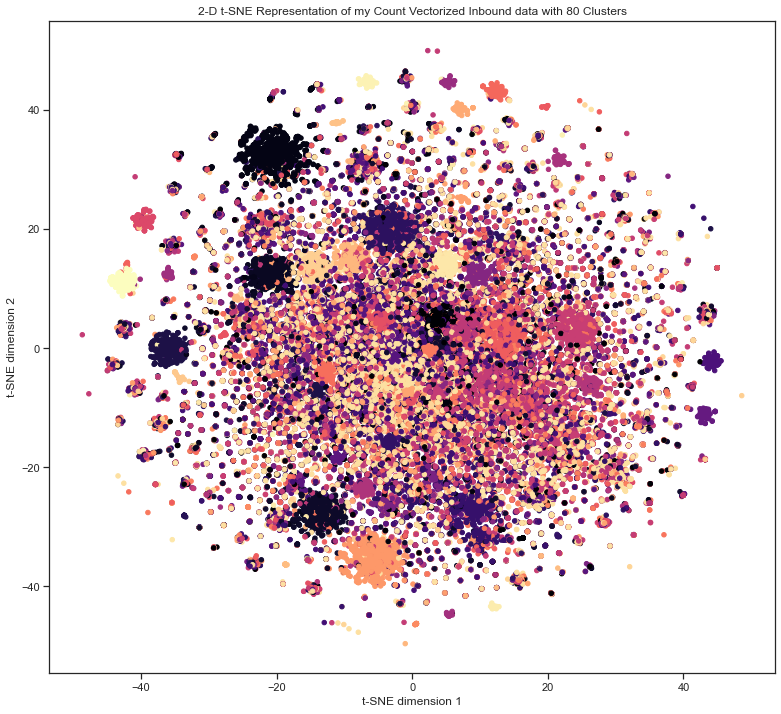

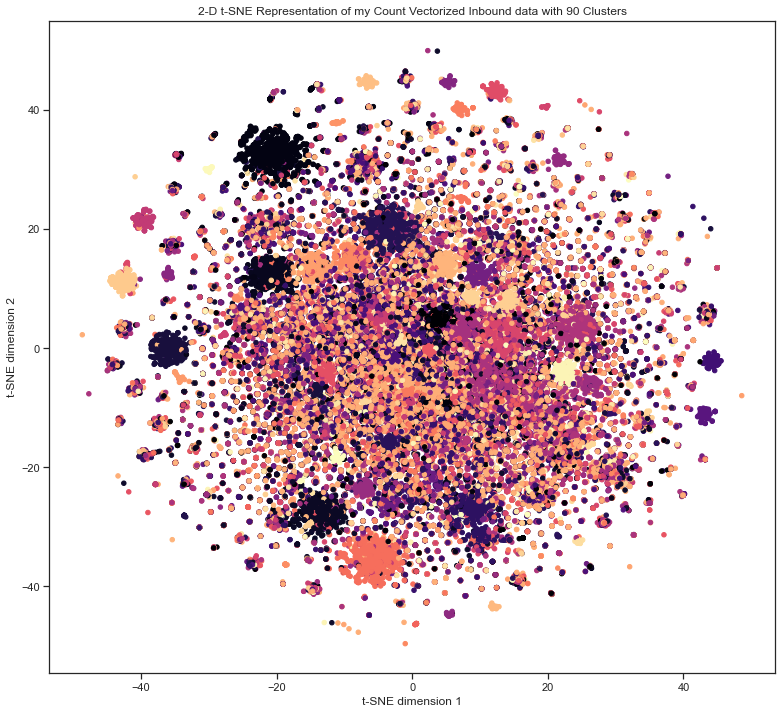

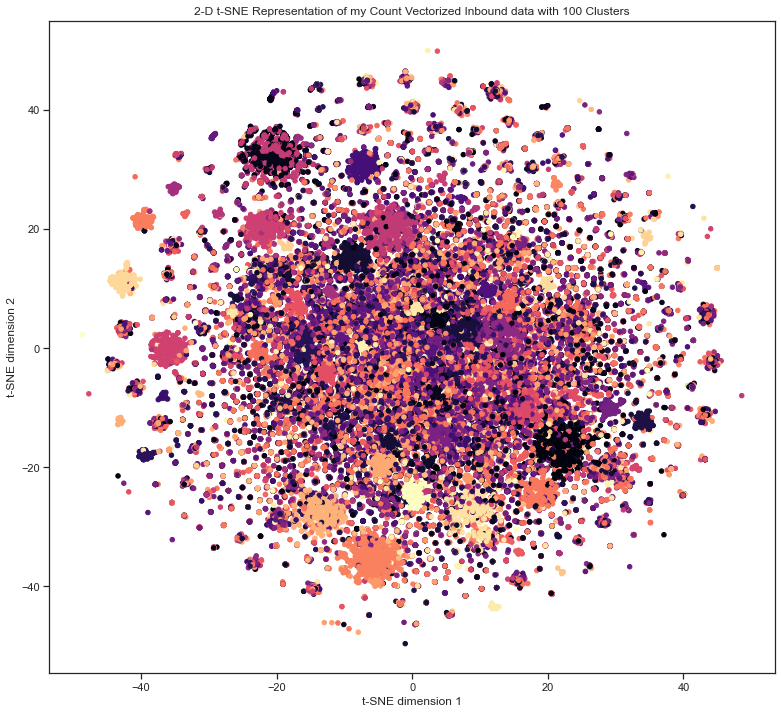

In [165]:
# Plotting my visualization for each of my n_neighbors with my count vectorized data

for k in range(10,101,10):
    # Getting the right K-Means cluster labels.
    labels = joblib.load(f'models/kmeans/inbound_cv_ma-{str(k)}neighbors.sav').labels_
    
    # Visualize high-dimensional data
    plt.figure(figsize=(13,12))
    plt.scatter(inbound_cv_ma_tsne[:,0], inbound_cv_ma_tsne[:,1], s=20, c = labels, cmap = 'magma')
    plt.title(f'2-D t-SNE Representation of my Count Vectorized Inbound data with {k} Clusters')
    plt.xlabel('t-SNE dimension 1')
    plt.ylabel('t-SNE dimension 2')
    plt.show()

At first I thought that I couldn't really see any clusters! But remember that I have so much data points, so I have to make these clusters quite big. Cool plot, and although a 2D representation of our very high dimensional data won't be super accuracy, we are far from seeing clear clusters!

I don't expect it to differ much, but let's see the same plot for my TFIDF data.

In [149]:
%time
# Instantiate t-SNE
tsne = TSNE(n_components=2, random_state=1, n_jobs=-1)

# Fit t-SNE
inbound_tfidf_ma_tsne = tsne.fit_transform(inbound_tfidf_ma)

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 35 µs


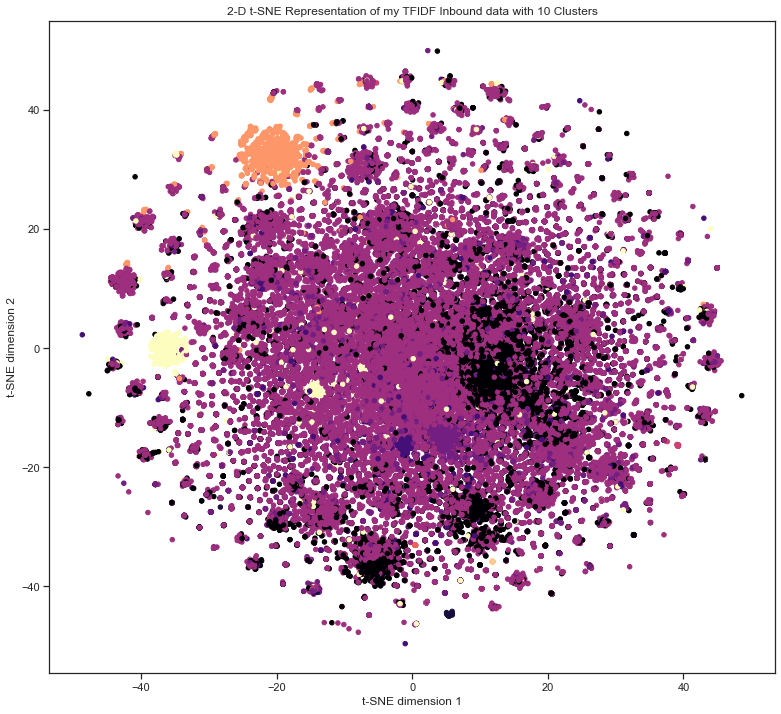

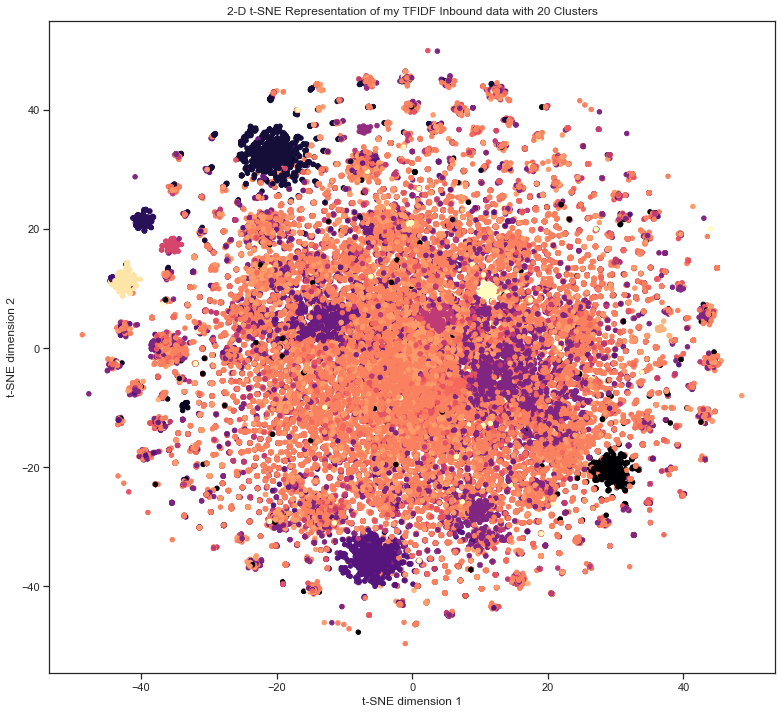

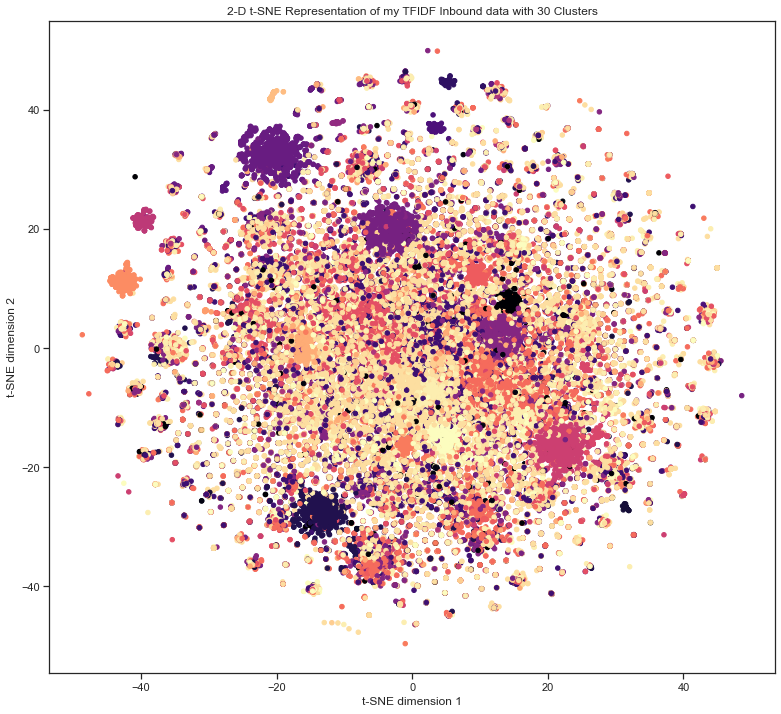

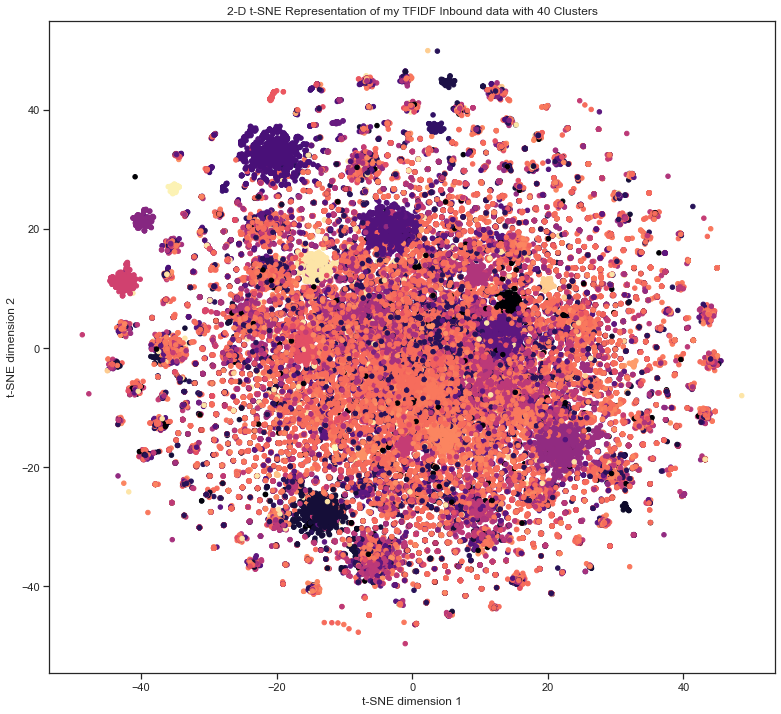

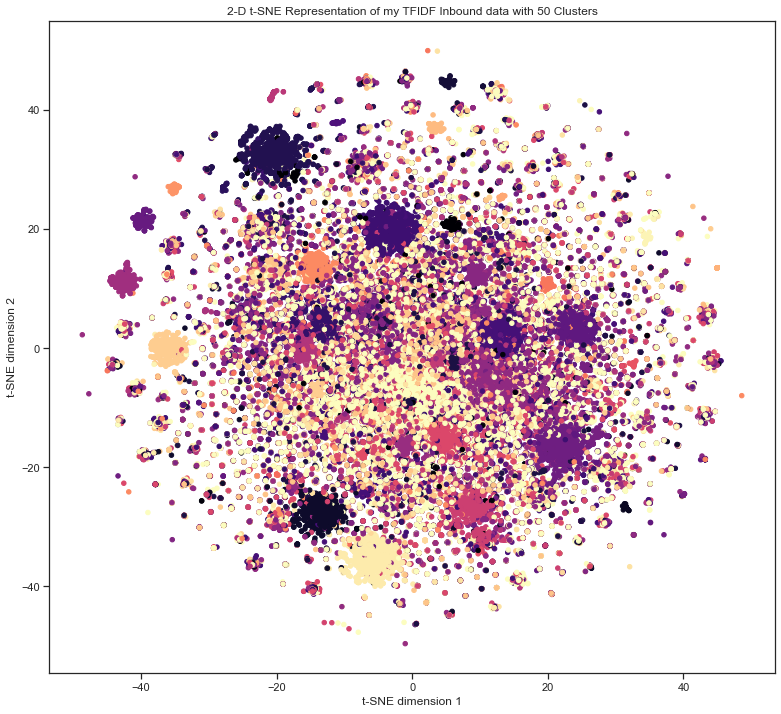

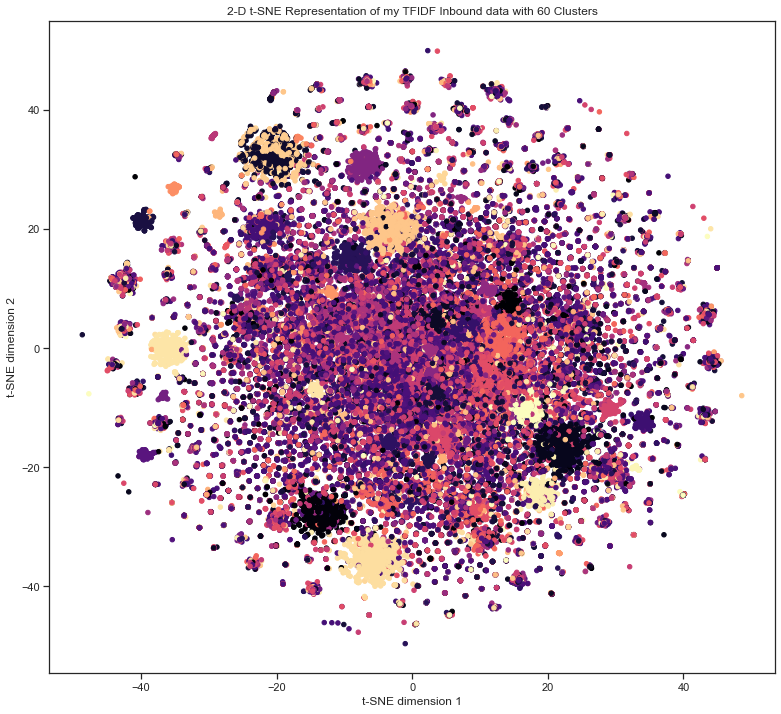

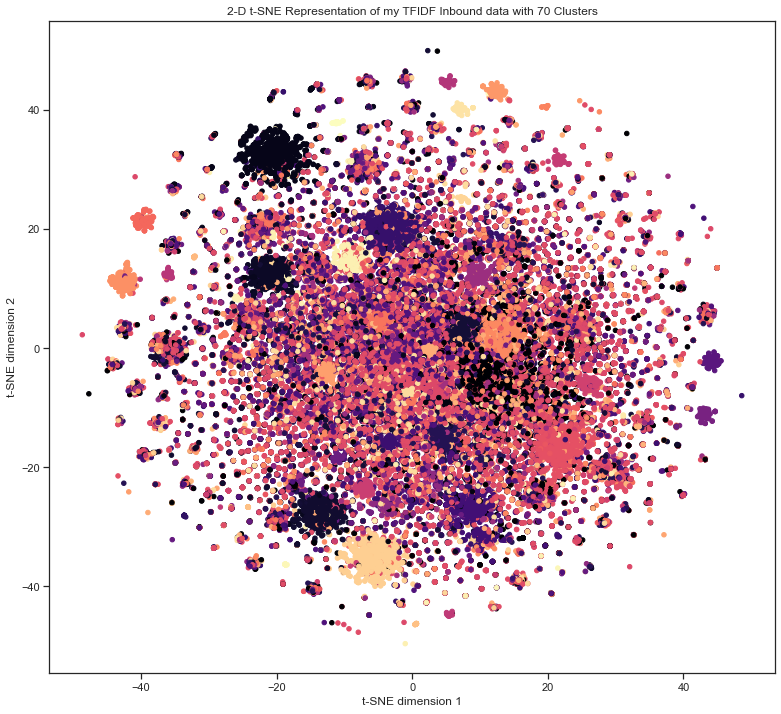

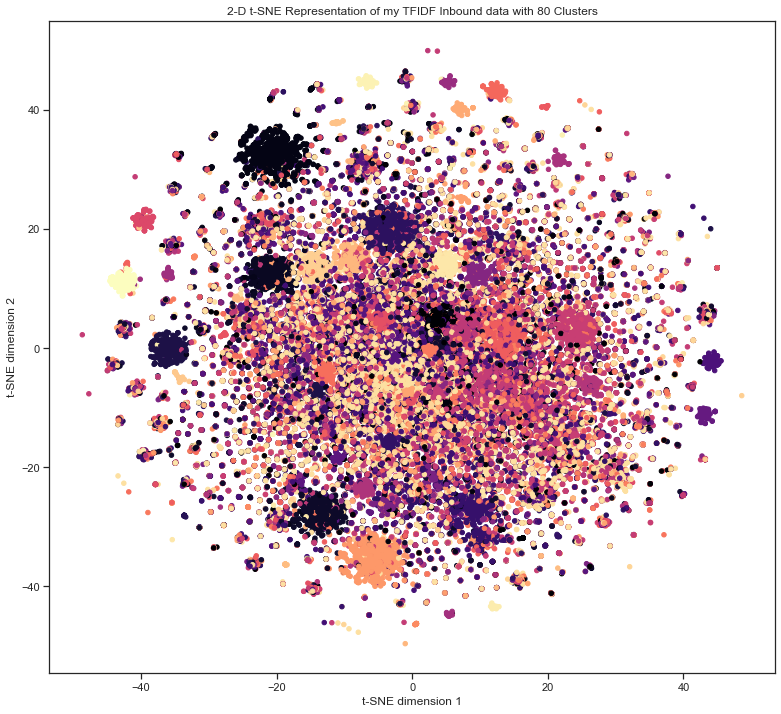

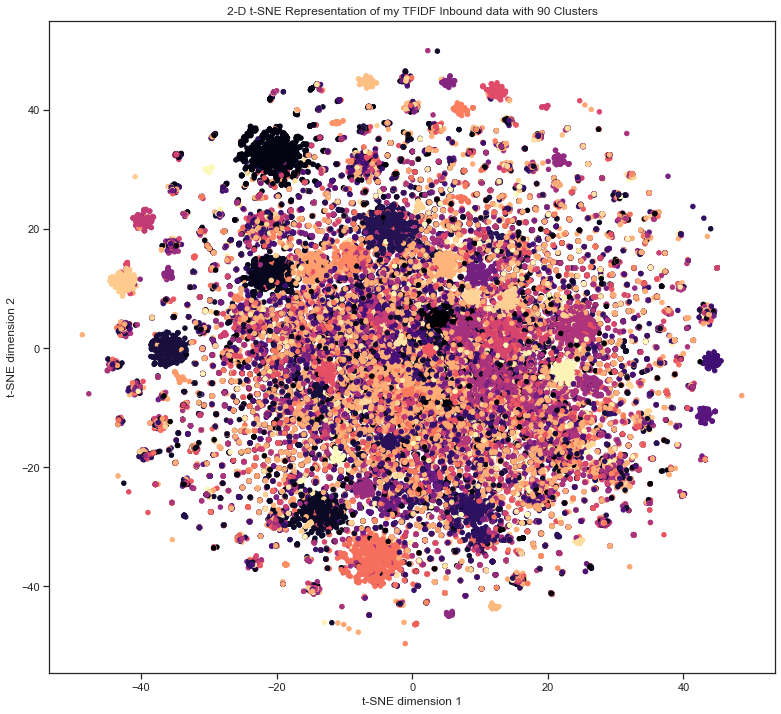

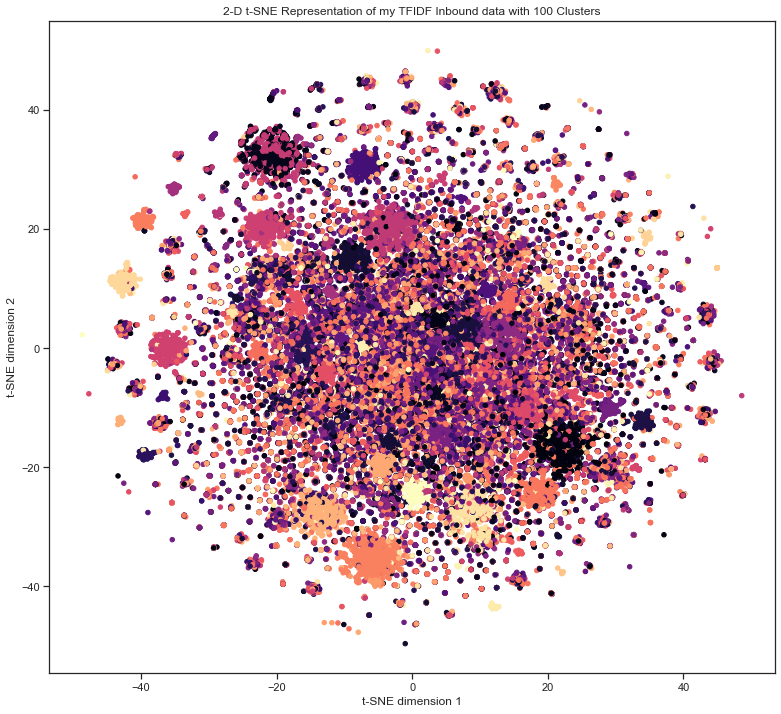

In [166]:
# Plotting my visualization for each of my n_neighbors with my tfidf data

for k in range(10,101,10):
    # Getting the right K-Means cluster labels.
    labels = joblib.load(f'models/kmeans/inbound_tfidf_ma-{str(k)}neighbors.sav').labels_
    
    # Visualize high-dimensional data
    plt.figure(figsize=(13,12))
    plt.scatter(inbound_tfidf_ma_tsne[:,0], inbound_tfidf_ma_tsne[:,1], s=20, c = labels, cmap = 'magma')
    plt.title(f'2-D t-SNE Representation of my TFIDF Inbound data with {k} Clusters')
    plt.xlabel('t-SNE dimension 1')
    plt.ylabel('t-SNE dimension 2')
    plt.show()

Sure enough, these look really similar to the count vectorized clusters! Let's move on to the word embedding clusters, which I think are more interesting.

## 1.2. K-Means for my Doc2Vec data

Notice that I did not scale my d2v data on purpose because I do not want to skew the distances that the pretrained model created.

In [170]:
# Vectorized data
vectorized_data = {'inbound_cv_d2v': inbound_d2v}
# Briefly showing the contents of i and j
for i,j in enumerate(vectorized_data.items()): print(i,j);

0 ('inbound_cv_d2v', array([[ 1.3538725 , -7.735182  ,  0.37681428, ..., -0.21115758,
         2.904047  ,  0.1384775 ],
       [-4.837879  , -2.0217264 ,  1.0109123 , ..., -2.671165  ,
         1.4473532 , -1.8422927 ],
       [ 0.17738637, -3.1127374 ,  1.0567894 , ...,  3.077314  ,
         0.41069612,  2.1518245 ],
       ...,
       [ 3.220659  ,  0.6421991 ,  5.666268  , ...,  6.6315455 ,
        -2.0285888 ,  7.9983263 ],
       [-1.0082532 ,  3.212106  ,  5.4109254 , ..., -0.8037264 ,
         2.675718  ,  0.63683057],
       [-4.894689  , -5.303509  , -3.9404087 , ...,  0.24032432,
         4.511389  ,  0.23934491]], dtype=float32))


In [171]:
# My d2v dictionaries that will store all my results
wcss_d2v = {}
labels_d2v = {}
silhouette_scores_d2v = {}
n_clusters = [10,20,30,40,50,60,70,80,90,100]

# Iterating through all the differently embedded data
for i,j in tqdm(enumerate(vectorized_data.items())): 
    name = j[0] # Here j[0] is the name of the dataset
    dataset = j[1] # And j[1] is the actual data
    
    # I store my metrics at these following lists
    wcss = []
    labels = []
    silhouette_scores = []
    
    # Looping through values of k
    for k in tqdm(n_clusters):    
        print(f'Currently fitting {name} with {k} clusters... Please wait')
        
        # Initializing with k-means++ ensures that you get don’t fall into the random initialization trap.
        kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state = 10)
        kmeans.fit(dataset)
        wcss.append(kmeans.inertia_)
        
        # Getting the silhouette score
        labels.append(kmeans.labels_)
        silhouette_scores.append(silhouette_score(dataset, kmeans.labels_))
        
        # Saving the models
        filename = f'models/kmeans/{name}-{k}neighbors.sav'
        joblib.dump(kmeans, filename)
        
    # Updating d2v dictionary
    wcss_d2v[name + '_wcss'] = wcss
    labels_d2v[name + '_labels'] = labels
    silhouette_scores_d2v[name + '_silhouettes'] = silhouette_scores

# Saving all my results, now with a d2v tag
with open('objects/wcss_d2v.pkl', 'wb') as handle:
    pickle.dump(wcss_d2v, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('objects/labels_d2v.pkl', 'wb') as handle:
    pickle.dump(labels_d2v, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
with open('objects/silhouette_scores_d2v.pkl', 'wb') as handle:
    pickle.dump(silhouette_scores_d2v, handle, protocol=pickle.HIGHEST_PROTOCOL)

/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


/opt/anaconda3/envs/chatbot/lib/python3.7/site-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Currently fitting inbound_cv_d2v with 10 clusters... Please wait
Currently fitting inbound_cv_d2v with 20 clusters... Please wait
Currently fitting inbound_cv_d2v with 30 clusters... Please wait
Currently fitting inbound_cv_d2v with 40 clusters... Please wait
Currently fitting inbound_cv_d2v with 50 clusters... Please wait
Currently fitting inbound_cv_d2v with 60 clusters... Please wait
Currently fitting inbound_cv_d2v with 70 clusters... Please wait
Currently fitting inbound_cv_d2v with 80 clusters... Please wait
Currently fitting inbound_cv_d2v with 90 clusters... Please wait
Currently fitting inbound_cv_d2v with 100 clusters... Please wait




### Reading back in the results.

In [172]:
# Storing it into objects I can use in this notebook

with open('objects/wcss_d2v.pkl', 'rb') as handle:
    wcss_d2v = pickle.load(handle)
with open('objects/labels_d2v.pkl','rb') as handle:
    labels_d2v = pickle.load(handle)
with open('objects/silhouette_scores_d2v.pkl','rb') as handle:
    silhouette_scores_d2v = pickle.load(handle)

Here are my plots:

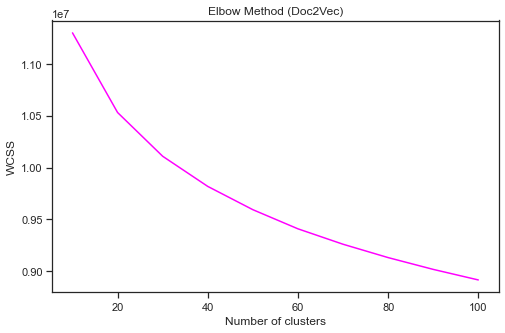

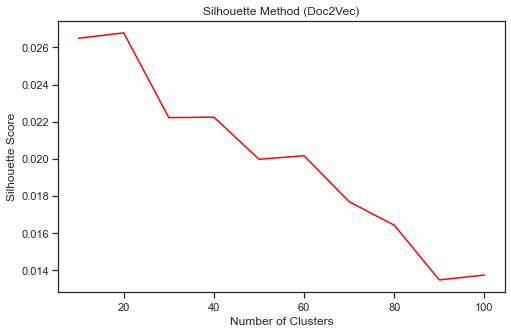

In [178]:
# Elbow Plot d2v
plt.figure(figsize=(8,5))
plt.plot(range(10, 101, 10), wcss_d2v['inbound_cv_d2v_wcss'], color = 'magenta')
plt.title('Elbow Method (Doc2Vec)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Silouette Plot d2v
plt.figure(figsize=(8,5))
plt.plot(range(10, 101, 10), silhouette_scores_d2v['inbound_cv_d2v_silhouettes'], color = 'red')
plt.title('Silhouette Method (Doc2Vec)')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

Great, now we see that we have a slightly higher silhouette score which isn't negative now. It looks like K = 20 would be the best in this case as it has the highest silhouette score and there is sort of an elbow in the elbow plot, definitely more than at 80 clusters where it seems to be completely smooth.

In [180]:
%time
# Instantiate t-SNE
tsne = TSNE(n_components=2, random_state=1, n_jobs=-1)

# Fit t-SNE
inbound_d2v_tsne = tsne.fit_transform(inbound_d2v)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs


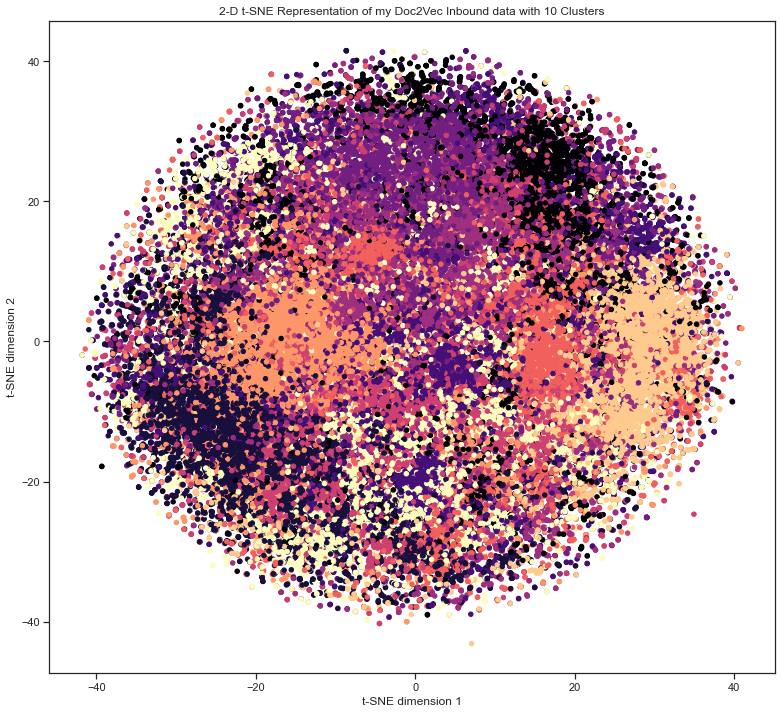

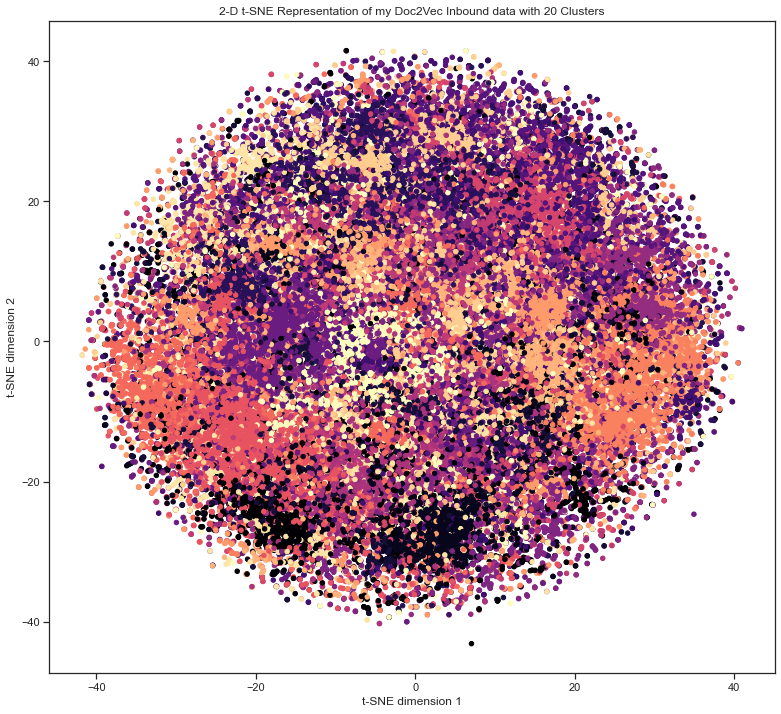

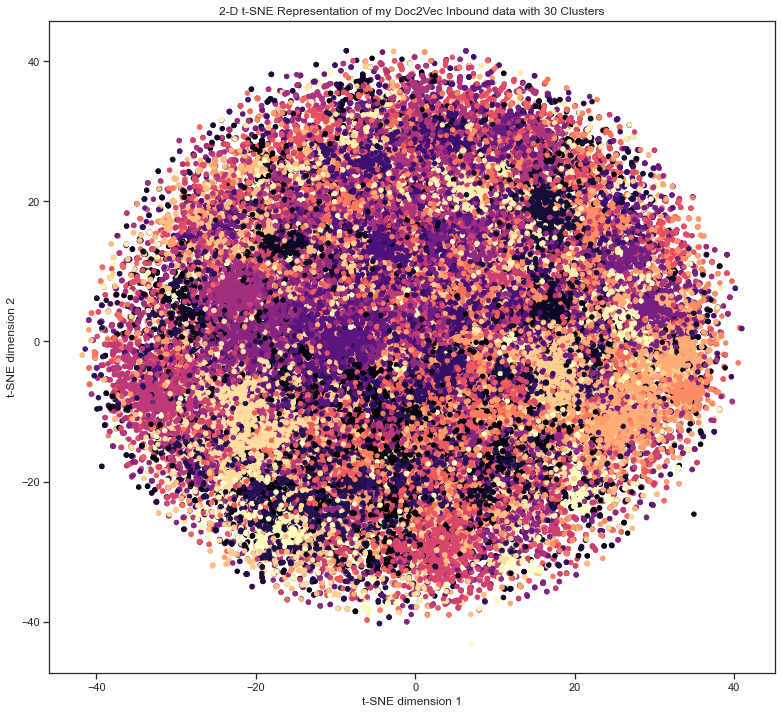

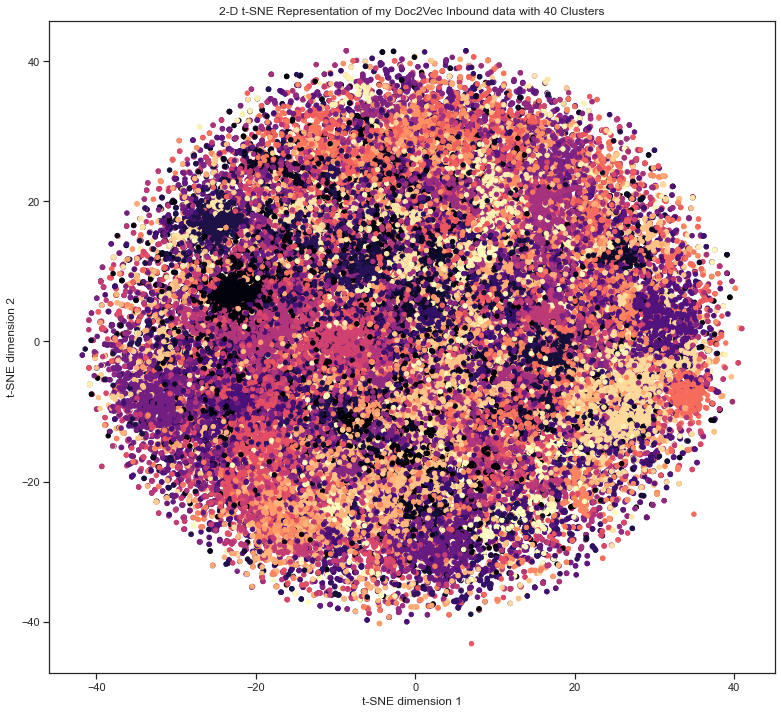

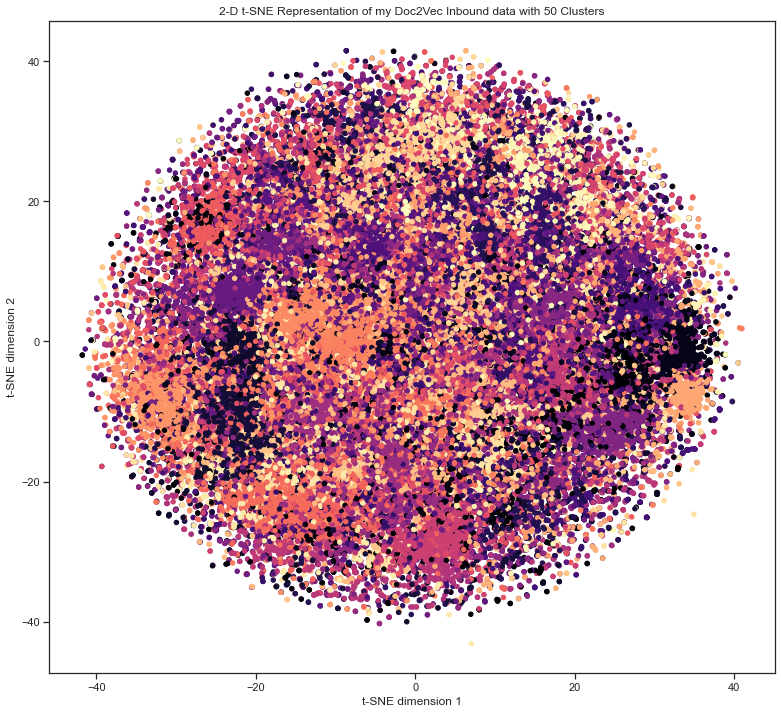

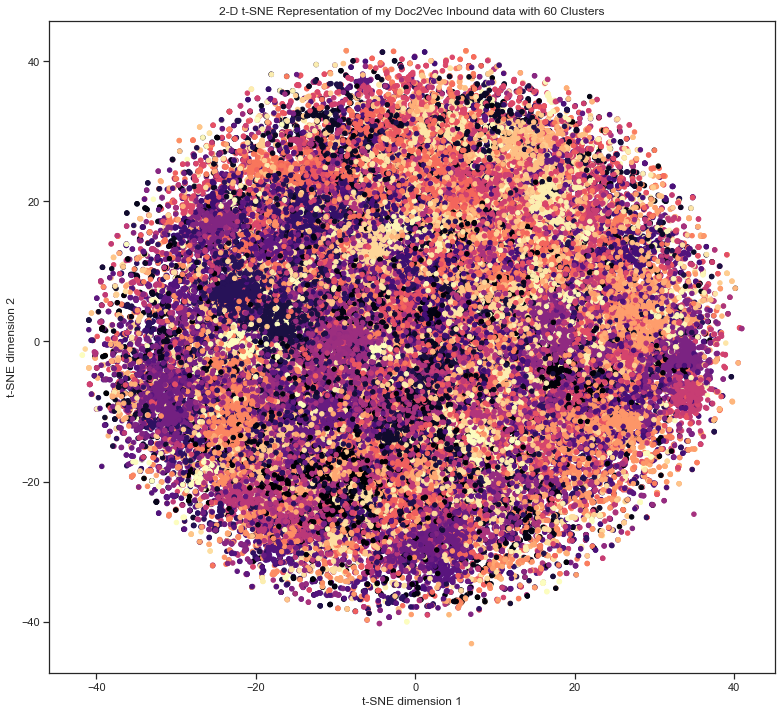

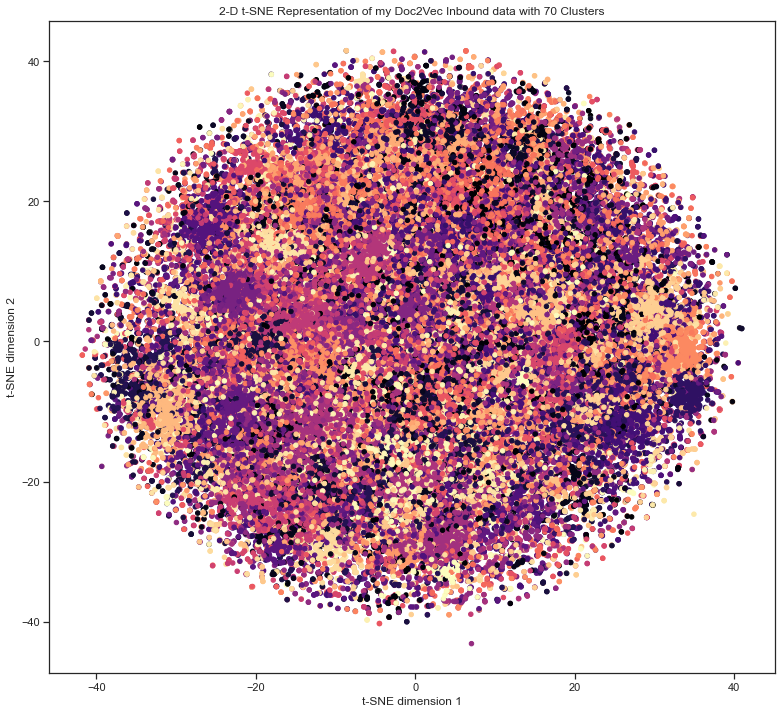

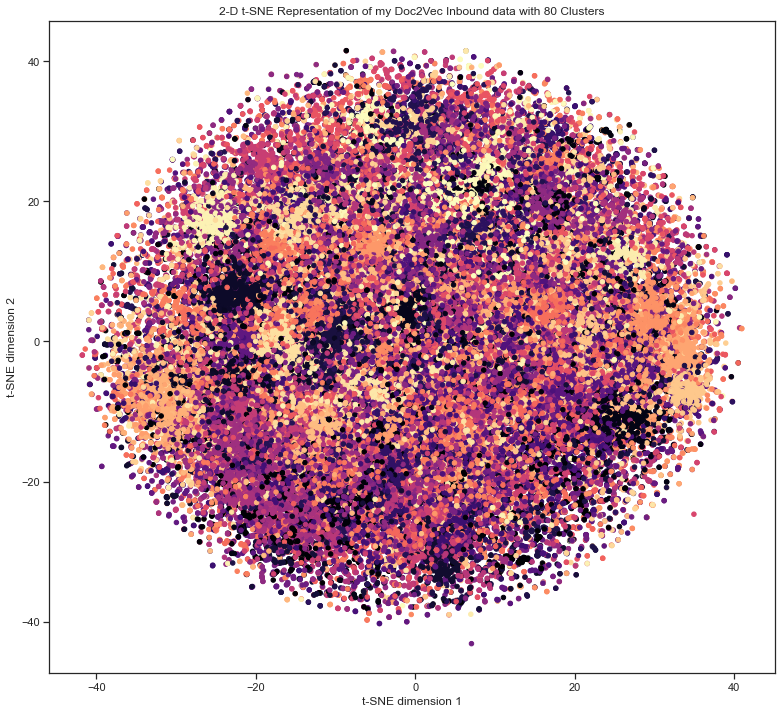

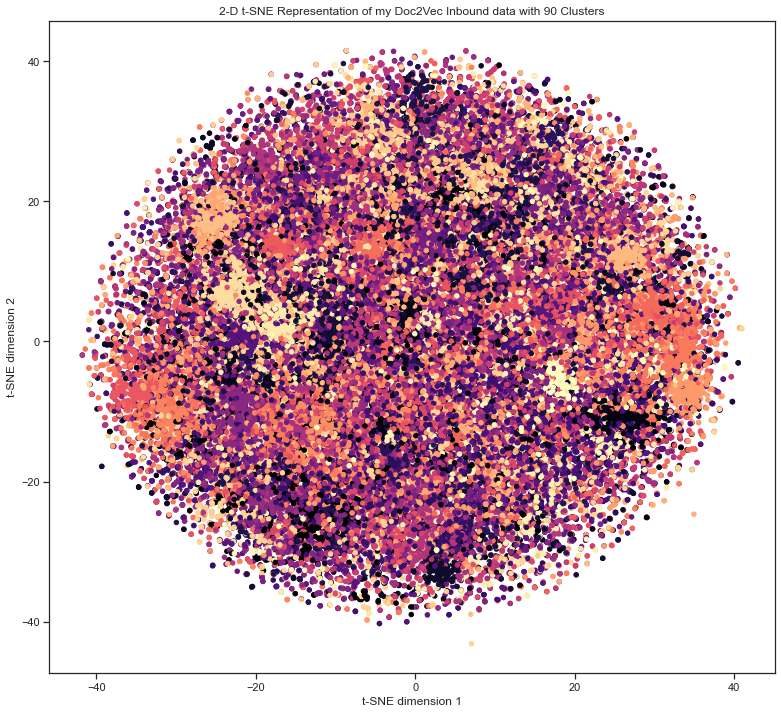

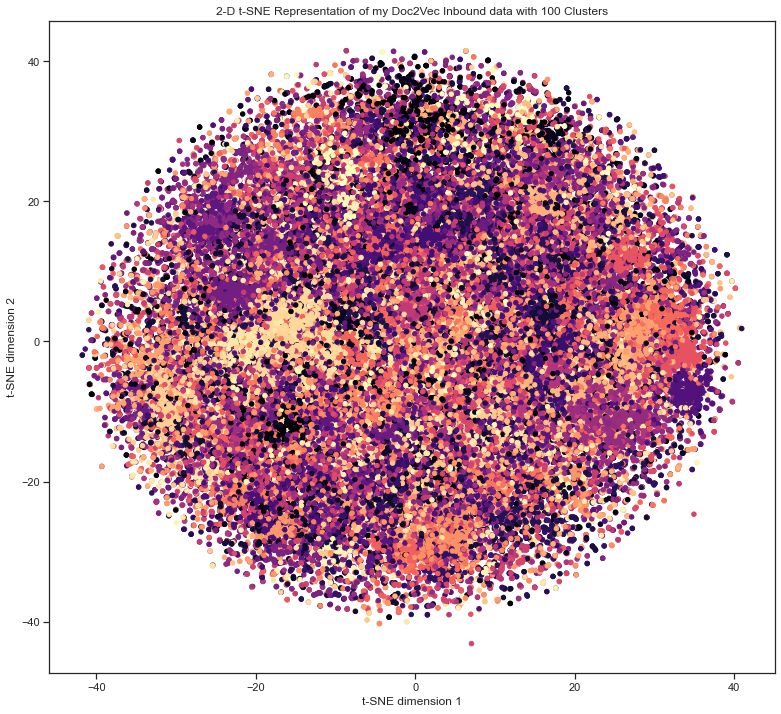

In [182]:
# Plotting my visualization for each of my n_neighbors, now with Doc2Vec embedded data

for k in range(10,101,10):
    # Getting the right K-Means cluster labels.
    labels = joblib.load(f'models/kmeans/inbound_cv_d2v-{str(k)}neighbors.sav').labels_
    
    # Visualize high-dimensional data
    plt.figure(figsize=(13,12))
    plt.scatter(inbound_d2v_tsne[:,0], inbound_d2v_tsne[:,1], s=20, c = labels, cmap = 'magma')
    plt.title(f'2-D t-SNE Representation of my Doc2Vec Inbound data with {k} Clusters')
    plt.xlabel('t-SNE dimension 1')
    plt.ylabel('t-SNE dimension 2')
    plt.show()

It's super hard to tell based on a t-SNE plot, so for that reason, I will evaluate how it clustered at a later section by actually looking at the labels!

## <font color = 'blue'>2. LDA (Latent Dirichlet Allocation) </color>
My second approach for the clustering is LDA topic modelling. It basically takes your data and splits it into topics. My goal is still to cluster, but with this method I hope to get more useful, distinct topics.

Useful articles:
* https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
* https://medium.com/nanonets/topic-modeling-with-lsa-psla-lda-and-lda2vec-555ff65b0b05

There are also newer, deep-learning based methods called LDA2Vec which could be interesting to explore as well.

In [ ]:
import warnings
warnings.simplefilter("ignore", DeprecationWarning)
# Load the LDA model from sk-learn
from sklearn.decomposition import LatentDirichletAllocation as LDA
 
# Helper function
def print_topics(model, count_vectorizer, n_top_words):
    words = count_vectorizer.get_feature_names()
    for topic_idx, topic in enumerate(model.components_):
        print("\nTopic #%d:" % topic_idx)
        print(" ".join([words[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
        
# Tweak the two parameters below
number_topics = 5
number_words = 10
# Create and fit the LDA model
lda = LDA(n_components=number_topics, n_jobs=-1)
lda.fit(count_data)
# Print the topics found by the LDA model
print("Topics found via LDA:")
print_topics(lda, count_vectorizer, number_words)

In [ ]:
%%time
from pyLDAvis import sklearn as sklearn_lda
import pickle 
import pyLDAvis
LDAvis_data_filepath = os.path.join('./ldavis_prepared_'+str(number_topics))
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
LDAvis_prepared = sklearn_lda.prepare(lda, count_data, count_vectorizer)
with open(LDAvis_data_filepath, 'w') as f:
        pickle.dump(LDAvis_prepared, f)
        
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath) as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './ldavis_prepared_'+ str(number_topics) +'.html')

For time constraint's sake, I decided not to use DBScan because they will achieve a clustering result similar to K-Means. I could have also use Gaussian Mixed Models or Heirarchical Clustering to achieve this clustering result.

## Finding and Visualizing Intent Differences Between Clusters

I saved all my models in a folder in this directory called folder. All that I have to do is pick a hyperparamater setting for that model and visualize what words are in those clusters.

In [6]:
processed_inbound

0        [new, update, i️, make, sure, download, yester...
4        [hey, anyone, else, upgraded, io, issue, capit...
9        [hello, internet, someone, explain, symbol, ke...
10       [get, screenshot, say, iphonex, reserve, email...
12       [thank, update, phone, even, slow, barely, wor...
                               ...                        
93399    [anyone, issue, osx, highsierra, slack, zoom, ...
93400    [hey, able, duplicate, file, page, search, rea...
93401    [yo, weird, glitch, w, capital, i️, attempt, m...
93402    [fuck, phone, keep, hang, call, show, call, fa...
93403    [anyone, iphone, issue, phone, freeze, randoml...
Length: 75917, dtype: object

I think it's really useful to see the top 10 words in a cluster to get a good idea of what the intents in that cluster is!

### Using scattertext from the spaCy universe for EDA
This [kernel](https://www.kaggle.com/psbots/customer-support-meets-spacy-universehttps://www.kaggle.com/psbots/customer-support-meets-spacy-universe) showed me what spaCy's scattertext tool is capable of doing! So I wanted to do it myself as well to hopefully get useful insights.

As said in the docs, scatter-text is "a tool for finding distinguishing terms in small-to-medium-sized corpora, and presenting them in a sexy, interactive scatter plot with non-overlapping term labels."

This will be very useful for comparing my intent clusters in the following notebook as well.

In [8]:
!ls models/kmeans

inbound_cv_d2v-100neighbors.sav   inbound_cv_ma-50neighbors.sav
inbound_cv_d2v-10neighbors.sav    inbound_cv_ma-60neighbors.sav
inbound_cv_d2v-20neighbors.sav    inbound_cv_ma-70neighbors.sav
inbound_cv_d2v-30neighbors.sav    inbound_cv_ma-80neighbors.sav
inbound_cv_d2v-40neighbors.sav    inbound_cv_ma-90neighbors.sav
inbound_cv_d2v-50neighbors.sav    inbound_tfidf_ma-100neighbors.sav
inbound_cv_d2v-60neighbors.sav    inbound_tfidf_ma-10neighbors.sav
inbound_cv_d2v-70neighbors.sav    inbound_tfidf_ma-20neighbors.sav
inbound_cv_d2v-80neighbors.sav    inbound_tfidf_ma-30neighbors.sav
inbound_cv_d2v-90neighbors.sav    inbound_tfidf_ma-40neighbors.sav
inbound_cv_ma-100neighbors.sav    inbound_tfidf_ma-50neighbors.sav
inbound_cv_ma-10neighbors.sav     inbound_tfidf_ma-60neighbors.sav
inbound_cv_ma-20neighbors.sav     inbound_tfidf_ma-70neighbors.sav
inbound_cv_ma-30neighbors.sav     inbound_tfidf_ma-80neighbors.sav
inbound_cv_ma-40neighbors.sav     inbound_tfidf_ma-90neighbors.sav


In [128]:
labels = joblib.load(f'models/kmeans/inbound_cv_d2v-10neighbors.sav').labels_

FileNotFoundError: [Errno 2] No such file or directory: 'models/kmeans/inbound_cv_d2v-10neighbors.sav'

# Scattertext for cluster evaluation

In [122]:
corpus = st.CorpusFromParsedDocuments(love['Text'], category_col = 
                             parsed_col = 'parsed').build()

TypeError: __init__() missing 1 required positional argument: 'category_col'

In [45]:
# html = st.produce_scattertext_explorer(corpus,
#           category='British_Airways',
#           category_name='British Airways',
#           not_category_name='American Airlines',
#           width_in_pixels=600,
#           minimum_term_frequency=10,
#           term_significance = st.LogOddsRatioUninformativeDirichletPrior(),
#           )

In [46]:
# uncomment this cell to load the interactive scattertext visualisation
# filename = "americanAir-vs-britishAirways.html"
# open(filename, 'wb').write(html.encode('utf-8'))
# IFrame(src=filename, width = 800, height=700)

In [ ]:
### Using scattertext from the spaCy universe for EDA
This [kernel](https://www.kaggle.com/psbots/customer-support-meets-spacy-universehttps://www.kaggle.com/psbots/customer-support-meets-spacy-universe) showed me what spaCy's scattertext tool is capable of doing! So I wanted to do it myself as well to hopefully get useful insights.

As said in the docs, scatter-text is "a tool for finding distinguishing terms in small-to-medium-sized corpora, and presenting them in a sexy, interactive scatter plot with non-overlapping term labels."

This will be very useful for comparing my intent clusters in the following notebook as well.

corpus = st.CorpusFromParsedDocuments(processed_inbound,
                             parsed_col = 'parsed').build()

# html = st.produce_scattertext_explorer(corpus,
#           category='British_Airways',
#           category_name='British Airways',
#           not_category_name='American Airlines',
#           width_in_pixels=600,
#           minimum_term_frequency=10,
#           term_significance = st.LogOddsRatioUninformativeDirichletPrior(),
#           )

# uncomment this cell to load the interactive scattertext visualisation
# filename = "americanAir-vs-britishAirways.html"
# open(filename, 'wb').write(html.encode('utf-8'))
# IFrame(src=filename, width = 800, height=700)def top10_bagofwords(data):
    ''' Taking as input the data and plots the top 10 words based on counts in this text data'''
    bagofwords = CountVectorizer()
    inbound = bagofwords.fit_transform(data)
    inbound # Output will be a sparse matrix
    # Inspecting of often contractions and colloquial language is used
    word_counts = np.array(np.sum(inbound, axis=0)).reshape((-1,))
    words = np.array(bagofwords.get_feature_names())
    words_df = pd.DataFrame({"word":words, 
                             "count":word_counts})
    words_rank = words_df.sort_values(by="count", ascending=False)
    # words_rank.to_csv('words_rank.csv') # Storing it in a csv so I can inspect and go through it myself
    words_rank.head()
    # Visualizing top 10 words
    plt.figure(figsize=(12,8))
    sns.barplot(words_rank['word'][:10], words_rank['count'][:10].astype(str), color = 'salmon')
    plt.title('Top 10 Most Common Words in My Data')
    plt.show()